# View Cell Neighborhood using Alphashape
Data is obtained from 10X Genomics

In [1]:
%load_ext autoreload
%autoreload 2
%env ANYWIDGET_HMR=1

env: ANYWIDGET_HMR=1


In [2]:
import celldega as dega
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import geopandas as gpd
from celldega.pre.boundary_tile import batch_transform_geometries
import geopandas as gpd


# Data initialization

In [3]:
dataset_name = 'Xenium_V1_human_Pancreas_FFPE_outs'
tech = 'Xenium'

DATA_DIR = f'/Users/whuan/dev/celldega/data'
data_dir = f'{DATA_DIR}/{dataset_name}'
path_landscape_files = f'{DATA_DIR}/landscapes/{dataset_name}'

## Load region polygon (both in pixel and micron space)


In [4]:
# Load Geo parquet
gdf_micron = gpd.read_parquet(f'{path_landscape_files}/sketched_regions_micron.parquet')

## Calculate alphashapes and convert to micron space

In [6]:
meta_cell_ini = pd.read_parquet(f'{path_landscape_files}/cell_metadata.parquet')
cluster = pd.read_parquet(f'{path_landscape_files}/cell_clusters/cluster.parquet')
meta_cluster = pd.read_parquet(f'{path_landscape_files}/cell_clusters/meta_cluster.parquet')
meta_cell = pd.concat([meta_cell_ini, cluster], axis=1)

# Calculate alpha shape
gdf_alpha = dega.nbhd.alpha_shape_cell_clusters(meta_cell, cat='cluster', alphas=[100, 150, 200, 250, 300, 350])
gdf_alpha_micron = gdf_alpha.copy()


# Convert to micron space
path_transformation_matrix = f'{path_landscape_files}/xenium_transform.csv'

transformation_matrix = pd.read_csv(
    path_transformation_matrix, header=None, sep=" "
).values

# From pixel to micron space
inverse_matrix = np.linalg.inv(transformation_matrix)

gdf_alpha_micron["geometry"] = batch_transform_geometries(gdf_alpha_micron["geometry"], inverse_matrix, 1)

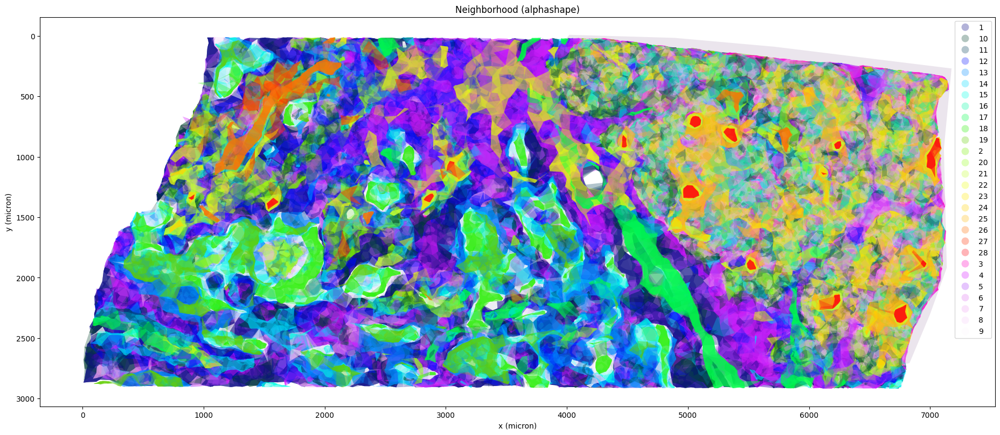

In [9]:
subset_view = False

fig, ax = plt.subplots(figsize=(20,8))
gdf_micron.plot(ax=ax, column='roi', legend=True, cmap='viridis', alpha=0.1)
gdf_alpha_micron.plot(ax=ax, aspect=1, column='cat', legend=True, cmap='gist_ncar', alpha=0.3)
# gdf_micron.plot(ax=ax, column='roi', legend=True, cmap='viridis', alpha=0.9, edgecolor='black', facecolor='none')
ax.invert_yaxis()
plt.title(f"Neighborhood (alphashape)")
plt.tight_layout()
plt.xlabel('x (micron)')
plt.ylabel('y (micron)')
if subset_view:
    plt.xlim(1000, 3000)
    plt.ylim(1400, 2500)
plt.show()